In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
df = pd.read_csv('cust_data.csv')
df.shape

(7043, 30)

In [5]:
# pip install import-ipynb    

In [6]:
import import_ipynb
import stats_nb

total_monthly_contract = stats_nb.total_monthly_contract

importing Jupyter notebook from stats_nb.ipynb
3875 1473 1695 7043
3555 3488 7043
1142 5901 7043
3402 3641 7043
1627 5416 7043
4974 1062 72 0 32.37114865824223
6361 682 7043
2971 3390 6361
2421 3096 1526 7043
2019 3498 5517
2429 3088 5517
2422 3095 5517
2044 3473 5517
2707 2810 5517
2732 2785 5517
4171 2872 7043
1544 1612 1522 2365 7043
64.76169246059918 2281.2532585545932
1869 5174 7043
6500 2003 4400.295754650007
100 5 58.69941786170666


### Statistics for Data

In [7]:
print('Phone Service', df['Phone Service'].unique())
print('Multiple Lines', df['Multiple Lines'].unique())
print('Internet Service', df['Internet Service'].unique())
print('Online Security', df['Online Security'].unique())
print('Online Backup', df['Online Backup'].unique())
print('Device Protection', df['Device Protection'].unique())
print('Tech Support', df['Tech Support'].unique())
print('Streaming TV', df['Streaming TV'].unique())
print('Streaming Movies', df['Streaming Movies'].unique())

Phone Service ['Yes' 'No']
Multiple Lines ['No' 'Yes' 'No phone service']
Internet Service ['DSL' 'Fiber optic' 'No']
Online Security ['Yes' 'No' 'No internet service']
Online Backup ['Yes' 'No' 'No internet service']
Device Protection ['No' 'Yes' 'No internet service']
Tech Support ['No' 'Yes' 'No internet service']
Streaming TV ['No' 'Yes' 'No internet service']
Streaming Movies ['No' 'Yes' 'No internet service']


In [8]:
contract_map = {
    'Monthly': total_monthly_contract,
    'Annually': stats_nb.total_annual_contract,
    'Binnually': stats_nb.total_binnual_contract
}

#### Analysis over 'Churn Reasoning' to find patterns among others

In [9]:
print("Unique churn reasons:")
churn_reasons = df['Churn Reason'].unique()
churn_reasons

Unique churn reasons:


array(['Competitor made better offer', 'Moved',
       'Competitor had better devices',
       'Competitor offered higher download speeds',
       'Competitor offered more data', 'Price too high',
       'Product dissatisfaction', 'Service dissatisfaction',
       'Lack of self-service on Website', 'Network reliability',
       'Limited range of services',
       'Lack of affordable download/upload speed',
       'Long distance charges', 'Extra data charges', "Don't know",
       'Poor expertise of online support',
       'Poor expertise of phone support', 'Attitude of service provider',
       'Attitude of support person', 'Deceased', nan], dtype=object)

In [10]:
freq_contract = []

for reason in churn_reasons:
    t = []
    month = df[(df['Churn Reason'] == reason) & (df['Contract Period'] == 1)].shape[0]
    ann = df[(df['Churn Reason'] == reason) & (df['Contract Period'] == 12)].shape[0]
    bi = df[(df['Churn Reason'] == reason) & (df['Contract Period'] == 24)].shape[0]
    t.extend([month, ann, bi])
    freq_contract.append(t)

print(freq_contract)

[[126, 10, 4], [43, 10, 0], [116, 10, 4], [161, 23, 5], [140, 16, 6], [89, 6, 3], [85, 10, 7], [83, 5, 1], [84, 2, 2], [92, 10, 1], [40, 4, 0], [36, 5, 3], [37, 5, 2], [53, 1, 3], [141, 12, 1], [18, 1, 0], [16, 3, 1], [115, 17, 3], [174, 16, 2], [6, 0, 0], [0, 0, 0]]


In [11]:
contract_period = ['Monthly', 'Annually', 'Biannually']

contract_period_reason_map = {churn_reasons[i]: freq_contract[i] for i in range(len(churn_reasons))}

print(contract_period_reason_map)

{'Competitor made better offer': [126, 10, 4], 'Moved': [43, 10, 0], 'Competitor had better devices': [116, 10, 4], 'Competitor offered higher download speeds': [161, 23, 5], 'Competitor offered more data': [140, 16, 6], 'Price too high': [89, 6, 3], 'Product dissatisfaction': [85, 10, 7], 'Service dissatisfaction': [83, 5, 1], 'Lack of self-service on Website': [84, 2, 2], 'Network reliability': [92, 10, 1], 'Limited range of services': [40, 4, 0], 'Lack of affordable download/upload speed': [36, 5, 3], 'Long distance charges': [37, 5, 2], 'Extra data charges': [53, 1, 3], "Don't know": [141, 12, 1], 'Poor expertise of online support': [18, 1, 0], 'Poor expertise of phone support': [16, 3, 1], 'Attitude of service provider': [115, 17, 3], 'Attitude of support person': [174, 16, 2], 'Deceased': [6, 0, 0], nan: [0, 0, 0]}


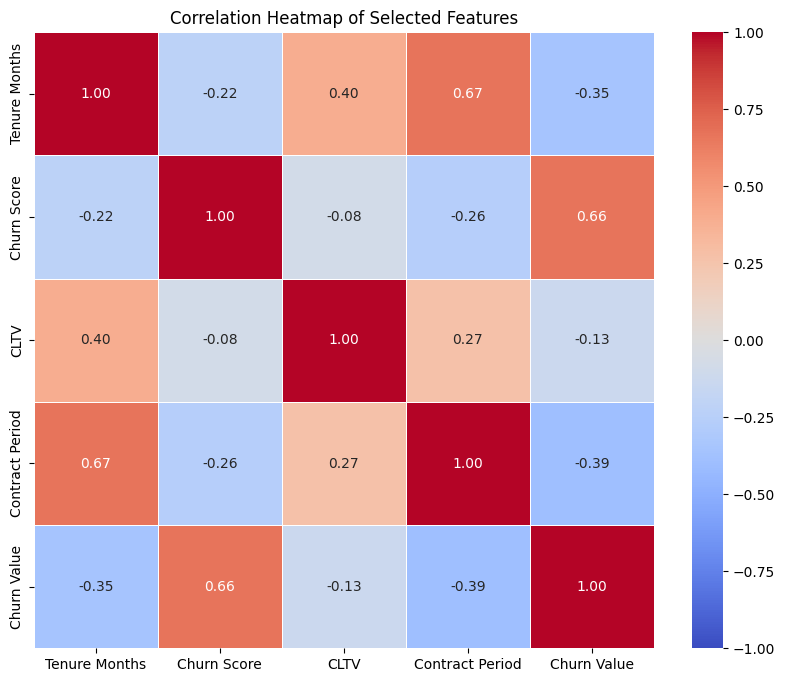

In [12]:
matrix = df[['Tenure Months', 'Churn Score', 'CLTV', 'Contract Period', 'Churn Value']]
correlation_matrix = matrix.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1, linewidths=0.5)
plt.title('Correlation Heatmap of Selected Features')
plt.show()

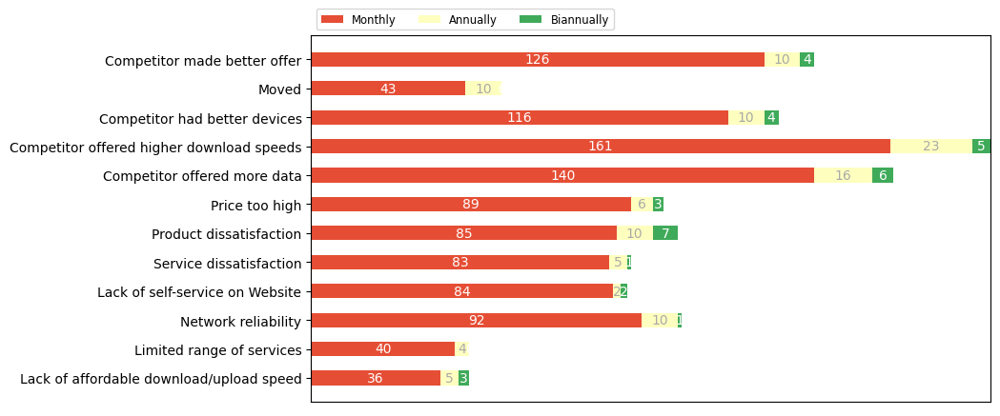

In [13]:
contract_period_reason_map = {
    'Competitor made better offer': [126, 10, 4],
    'Moved': [43, 10, 0],
    'Competitor had better devices': [116, 10, 4],
    'Competitor offered higher download speeds': [161, 23, 5],
    'Competitor offered more data': [140, 16, 6],
    'Price too high': [89, 6, 3],
    'Product dissatisfaction': [85, 10, 7],
    'Service dissatisfaction': [83, 5, 1],
    'Lack of self-service on Website': [84, 2, 2],
    'Network reliability': [92, 10, 1],
    'Limited range of services': [40, 4, 0],
    'Lack of affordable download/upload speed': [36, 5, 3],
}

def survey(results, category_names):
    labels = list(results.keys())
    data = np.array(list(results.values()))
    data_cum = data.cumsum(axis=1)
    category_colors = plt.get_cmap('RdYlGn')(np.linspace(0.15, 0.85, data.shape[1]))

    fig, ax = plt.subplots(figsize=(9.2, 5))
    ax.invert_yaxis()
    ax.xaxis.set_visible(False)
    ax.set_xlim(0, np.sum(data, axis=1).max())

    for i, (colname, color) in enumerate(zip(category_names, category_colors)):
        widths = data[:, i]
        starts = data_cum[:, i] - widths
        rects = ax.barh(labels, widths, left=starts, height=0.5,
                        label=colname, color=color)

        r, g, b, _ = color
        text_color = 'white' if r * g * b < 0.5 else 'darkgrey'
        
        widths_str = [str(width) for width in widths]
        ax.bar_label(rects, labels=widths_str, label_type='center', color=text_color)
    
    ax.legend(ncols=len(category_names), bbox_to_anchor=(0, 1),
              loc='lower left', fontsize='small')

    return fig, ax

survey(contract_period_reason_map, contract_period)
plt.show()

#### Churn Value vs Contract Period

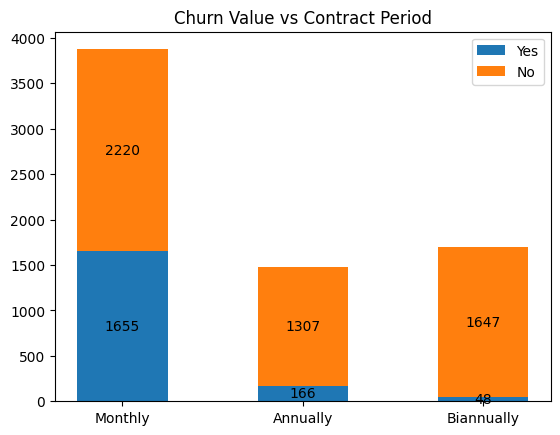

In [14]:
contract_counts = {
    'Yes': [stats_nb.total_churn_yes_monthly, stats_nb.total_churn_yes_annual, stats_nb.total_churn_yes_binnual],
    'No': [stats_nb.total_churn_no_monthly, stats_nb.total_churn_no_annual, stats_nb.total_churn_no_binnual]
}

width = 0.5

fig, ax = plt.subplots()
bottom = np.zeros(3)

for contract, contract_count in contract_counts.items():
    p = ax.bar(contract_period, contract_count, width, label=contract, bottom=bottom)
    bottom += contract_count
    ax.bar_label(p, label_type='center')

ax.set_title('Churn Value vs Contract Period')
ax.legend()
plt.show()

#### Churn Variation considering Tenure Months of customers against Contract Periods

C:\Users\sudar\AppData\Local\Temp\ipykernel_1492\3913137561.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  churn_data = df.groupby(['Contract Period', 'Tenure Category'])['Churn Label'].value_counts(normalize=True).unstack().fillna(0)


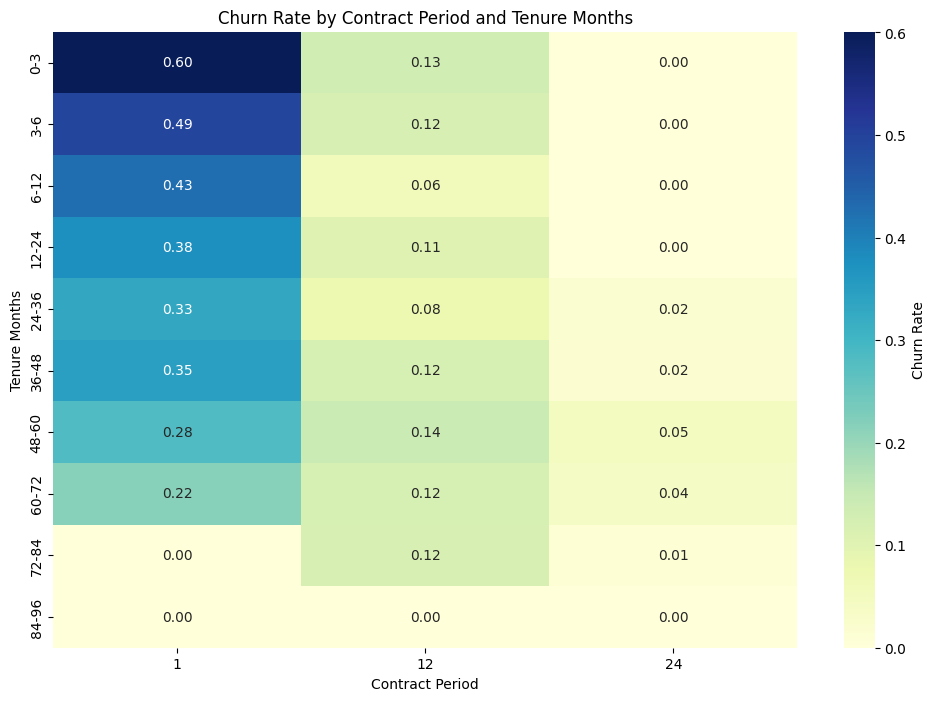



 This churn rate variation shows that fresh customers with tenure months < 12 and monthly subscription are churning.


In [15]:
bins = [0, 3, 6, 12, 24, 36, 48, 60, 72, 84, 96]
labels = ['0-3', '3-6', '6-12', '12-24', '24-36', '36-48', '48-60', '60-72', '72-84', '84-96']
df['Tenure Category'] = pd.cut(df['Tenure Months'], bins=bins, labels=labels, right=False)

churn_data = df.groupby(['Contract Period', 'Tenure Category'])['Churn Label'].value_counts(normalize=True).unstack().fillna(0)
churn_data = churn_data['Yes'] 
churn_pivot = churn_data.unstack(level=0)

plt.figure(figsize=(12, 8))
sns.heatmap(churn_pivot, annot=True, fmt=".2f", cmap='YlGnBu', cbar_kws={'label': 'Churn Rate'})
plt.title('Churn Rate by Contract Period and Tenure Months')
plt.xlabel('Contract Period')
plt.ylabel('Tenure Months')
plt.show()

print("\n\n This churn rate variation shows that fresh customers with tenure months < 12 and monthly subscription are churning.")

#### Customer Retention over Tenures

In [16]:
#check customer retention for current quater and compare with previous quater

current_quarter = df[(df['Tenure Months'] >= 0) & (df['Tenure Months'] <= 12)]
previous_quarter = df[(df['Tenure Months'] >= 12) & (df['Tenure Months'] <= 24)]

current_quarter_churn = current_quarter['Churn Label'].value_counts(normalize=True)
previous_quarter_churn = previous_quarter['Churn Label'].value_counts(normalize=True)

print("\nCurrent Quarter Churn Rate:")
print(current_quarter_churn)

print("\n\nPrevious Quarter Churn Rate:")
print(previous_quarter_churn)

print("\n\nThe churn rate has increased in the current quarter compared to the previous quarter.")


Current Quarter Churn Rate:
Churn Label
No     0.525618
Yes    0.474382
Name: proportion, dtype: float64


Previous Quarter Churn Rate:
Churn Label
No     0.709027
Yes    0.290973
Name: proportion, dtype: float64


The churn rate has increased in the current quarter compared to the previous quarter.


C:\Users\sudar\AppData\Local\Temp\ipykernel_1492\933916308.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  churn_data = df.groupby(['Quarter'])['Churn Label'].value_counts(normalize=True).unstack().fillna(0)


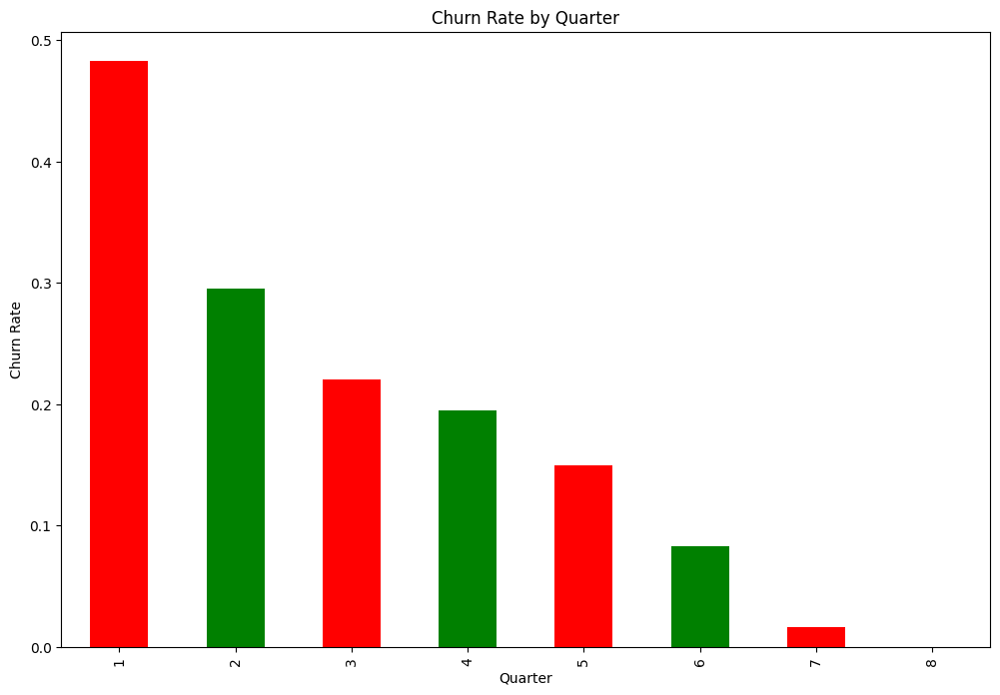

In [17]:
#now plot churn rate for last 10 quarters

bins = [0, 12, 24, 36, 48, 60, 72, 84, 96]
labels = ['1', '2', '3', '4', '5', '6', '7', '8']

df['Quarter'] = pd.cut(df['Tenure Months'], bins=bins, labels=labels, right=False)

churn_data = df.groupby(['Quarter'])['Churn Label'].value_counts(normalize=True).unstack().fillna(0)
churn_data = churn_data['Yes']

plt.figure(figsize=(12, 8))
churn_data.plot(kind='bar', stacked=True, color=['red', 'green'])

plt.title('Churn Rate by Quarter')
plt.xlabel('Quarter')
plt.ylabel('Churn Rate')
plt.show()


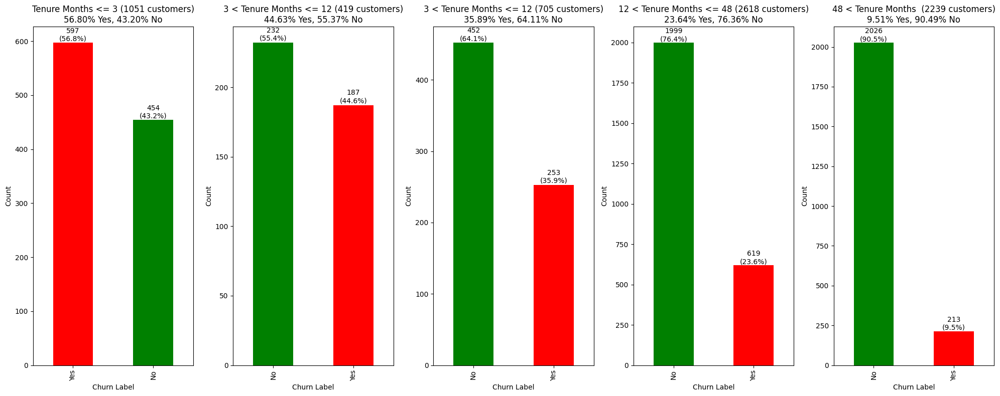

In [18]:
tenure_ranges = [
    {'title': 'Tenure Months <= 3', 'range': (0, 3)},
    {'title': '3 < Tenure Months <= 12', 'range': (3, 6)},
    {'title': '3 < Tenure Months <= 12', 'range': (6, 12)},
    {'title': '12 < Tenure Months <= 48', 'range': (12, 48)},
    {'title': '48 < Tenure Months ', 'range': (48, 96)}
]


fig, axes = plt.subplots(1, 5, figsize=(20, 8))
colors = {'Yes': 'red', 'No': 'green'}

for i, tenure_range in enumerate(tenure_ranges):
    filtered_data = df[(df['Tenure Months'] > tenure_range['range'][0]) & (df['Tenure Months'] <= tenure_range['range'][1])]
    total_customers = filtered_data.shape[0]
    churn_counts = filtered_data['Churn Label'].value_counts()
    percent_yes = churn_counts.get('Yes', 0) / total_customers * 100
    percent_no = churn_counts.get('No', 0) / total_customers * 100
    

    ax = axes[i]
    churn_counts.plot(kind='bar', ax=ax, color=[colors.get(label, 'blue') for label in churn_counts.index])
    ax.set_xlabel('Churn Label')
    ax.set_ylabel('Count')
    ax.set_title(f'{tenure_range["title"]} ({total_customers} customers)\n{percent_yes:.2f}% Yes, {percent_no:.2f}% No')
    for j, count in enumerate(churn_counts):
        ax.text(j, count + 0.5, f'{count}\n({count / total_customers * 100:.1f}%)', ha='center', va='bottom', fontsize=10)

    

plt.tight_layout()
plt.show()

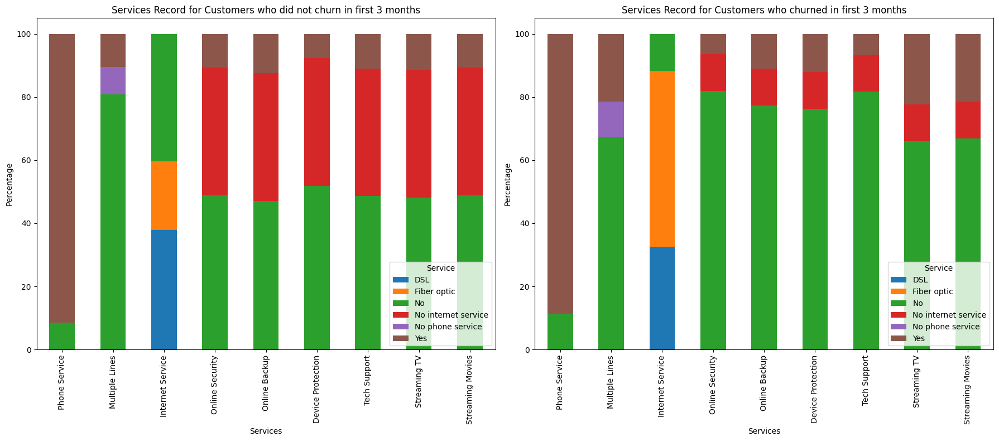

In [19]:
services = ['Phone Service', 'Multiple Lines', 'Internet Service', 'Online Security', 'Online Backup', 'Device Protection', 'Tech Support', 'Streaming TV', 'Streaming Movies']

services_data_no_churn = df[(df['Tenure Months'] <= 3) & (df['Churn Label'] != 'Yes')]
services_data_no_churn = services_data_no_churn[services]

# Calculate percentages
services_counts_no_churn = services_data_no_churn.apply(pd.Series.value_counts).T
services_counts_no_churn = services_counts_no_churn.div(services_counts_no_churn.sum(axis=1), axis=0) * 100
services_counts_no_churn = services_counts_no_churn.fillna(0)

# Filter data for customers who churned in the first 3 months
services_data_churn = df[(df['Tenure Months'] <= 3) & (df['Churn Label'] == 'Yes')]
services_data_churn = services_data_churn[services]

# Calculate percentages
services_counts_churn = services_data_churn.apply(pd.Series.value_counts).T
services_counts_churn = services_counts_churn.div(services_counts_churn.sum(axis=1), axis=0) * 100
services_counts_churn = services_counts_churn.fillna(0)

# Plotting
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 8))  # Adjust figsize as needed

# Plot for customers who did not churn
services_counts_no_churn.plot(kind='bar', stacked=True, ax=ax1)
ax1.set_title('Services Record for Customers who did not churn in first 3 months')
ax1.set_xlabel('Services')
ax1.set_ylabel('Percentage')
ax1.legend(title='Service')

# Plot for customers who churned
services_counts_churn.plot(kind='bar', stacked=True, ax=ax2)
ax2.set_title('Services Record for Customers who churned in first 3 months')
ax2.set_xlabel('Services')
ax2.set_ylabel('Percentage')
ax2.legend(title='Service')

plt.tight_layout()
plt.show()


In [20]:
#converting above analysis to mathematical values and storing in a dataframe

services_data = {
    'Service': [],
    'Service Type': [],
    'No Churn': [],
    'Churn': []
}

for service in services:
    for service_type in df[service].unique():
        services_data['Service'].append(service)
        services_data['Service Type'].append(service_type)
        services_data['No Churn'].append(services_counts_no_churn.get(service_type, 0).get(service, 0))
        services_data['Churn'].append(services_counts_churn.get(service_type, 0).get(service, 0))

services_df = pd.DataFrame(services_data)

services_df

,Service,Service Type,No Churn,Churn
0,Phone Service,Yes,91.397849,88.609715
1,Phone Service,No,8.602151,11.390285
2,Multiple Lines,No,80.860215,67.169179
3,Multiple Lines,Yes,10.537634,21.440536
4,Multiple Lines,No phone service,8.602151,11.390285
5,Internet Service,DSL,37.849462,32.495812
6,Internet Service,Fiber optic,21.720430,55.778894
7,Internet Service,No,40.430108,11.725293
8,Online Security,Yes,10.752688,6.365159
9,Online Security,No,48.817204,81.909548


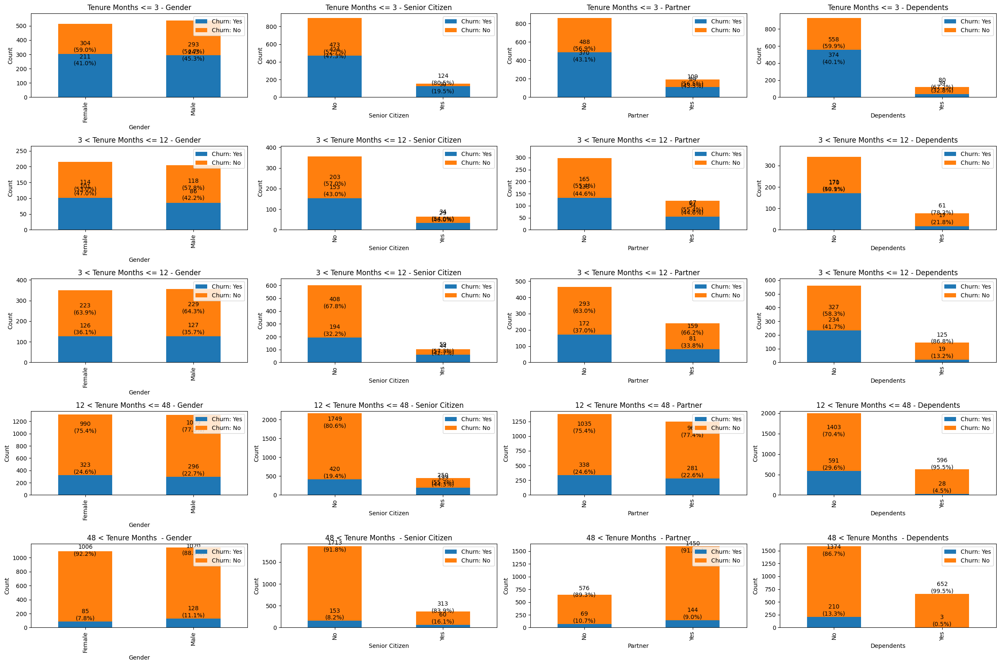

In [21]:
categories = ['Gender', 'Senior Citizen', 'Partner', 'Dependents']

fig, axes = plt.subplots(len(tenure_ranges), len(categories), figsize=(24, 16))

for i, tenure_range in enumerate(tenure_ranges):
    filtered_data = df[(df['Tenure Months'] > tenure_range['range'][0]) & (df['Tenure Months'] <= tenure_range['range'][1])]
    total_customers = filtered_data.shape[0]
    
    for j, category in enumerate(categories):
        churn_counts = filtered_data.groupby([category, 'Churn Label']).size().unstack(fill_value=0)
        churn_counts['Total'] = churn_counts['No'] + churn_counts['Yes']
        churn_counts['Percent_Yes'] = churn_counts['Yes'] / churn_counts['Total'] * 100
        churn_counts['Percent_No'] = churn_counts['No'] / churn_counts['Total'] * 100
        
        ax = axes[i, j]
        churn_counts[['Yes', 'No']].plot(kind='bar', stacked=True, ax=ax)
        ax.set_xlabel(category)
        ax.set_ylabel('Count')
        ax.set_title(f'{tenure_range["title"]} - {category}')
        
        x_offsets = np.array([0.0, 0.0])
        for idx, col in enumerate(['Yes', 'No']):
            for idx2, val in enumerate(churn_counts[col]):
                ax.text(idx2, val + 5, f'{val}\n({churn_counts[f"Percent_{col}"].iloc[idx2]:.1f}%)', ha='center', va='bottom', fontsize=10)
        
        ax.legend(['Churn: Yes', 'Churn: No'], loc='upper right')
        ax.set_ylim(0, max(filtered_data[category].value_counts()) + 50)
    
plt.tight_layout()
plt.show()

In [22]:
#converting above analysis to mathematical values and storing in a dataframe in percentages

categories_data = {
    'Category': [],
    'Category Type': [],
    'Tenure Range': [],
    'Churn': []
}

for category in categories:
    for category_type in df[category].unique():
        for i, tenure_range in enumerate(tenure_ranges):
            filtered_data = df[(df['Tenure Months'] > tenure_range['range'][0]) & (df['Tenure Months'] <= tenure_range['range'][1])]
            total_customers = filtered_data.shape[0]
            churn_counts = filtered_data.groupby([category, 'Churn Label']).size().unstack(fill_value=0)
            churn_counts['Total'] = churn_counts['No'] + churn_counts['Yes']
            churn_counts['Percent_Yes'] = churn_counts['Yes'] / churn_counts['Total'] * 100
            churn_counts['Percent_No'] = churn_counts['No'] / churn_counts['Total'] * 100
            categories_data['Category'].append(category)
            categories_data['Category Type'].append(category_type)
            categories_data['Tenure Range'].append(tenure_range['title'])
            categories_data['Churn'].append(churn_counts['Percent_Yes'].get(category_type, 0))

categories_df = pd.DataFrame(categories_data)

categories_df

,Category,Category Type,Tenure Range,Churn
0,Gender,Male,Tenure Months <= 3,54.664179
1,Gender,Male,3 < Tenure Months <= 12,42.156863
2,Gender,Male,3 < Tenure Months <= 12,35.674157
3,Gender,Male,12 < Tenure Months <= 48,22.681992
4,Gender,Male,48 < Tenure Months,11.149826
5,Gender,Female,Tenure Months <= 3,59.029126
6,Gender,Female,3 < Tenure Months <= 12,46.976744
7,Gender,Female,3 < Tenure Months <= 12,36.103152
8,Gender,Female,12 < Tenure Months <= 48,24.600152
9,Gender,Female,48 < Tenure Months,7.791017


In [23]:
billing_payment = ['Paperless Billing', 'Payment Method']

billing_payment_data = {
    'Billing/Payment': [],
    'Billing/Payment Type': [],
    'Churn': []
}

for billing in billing_payment:
    for billing_type in df[billing].unique():
        filtered_data = df[df[billing] == billing_type]
        
        churn_counts = filtered_data.groupby('Churn Label').size()
        total_customers = churn_counts.sum()
        churn_percent_yes = (churn_counts['Yes'] / total_customers) * 100
        
        billing_payment_data['Billing/Payment'].append(billing)
        billing_payment_data['Billing/Payment Type'].append(billing_type)
        billing_payment_data['Churn'].append(churn_percent_yes)


billing_payment_df = pd.DataFrame(billing_payment_data)

billing_payment_df

,Billing/Payment,Billing/Payment Type,Churn
0,Paperless Billing,Yes,33.565092
1,Paperless Billing,No,16.330084
2,Payment Method,Mailed check,19.106700
3,Payment Method,Electronic check,45.285412
4,Payment Method,Bank transfer (automatic),16.709845
5,Payment Method,Credit card (automatic),15.243101


In [24]:

churn_cltv = ['Churn Score', 'CLTV']

churn_cltv_data = {
    'Churn/CLTV': [],
    'Churn/CLTV Type': [],
    'Churn': []
}

avg_cltv = df['CLTV'].mean()
avf_churn_score = df['Churn Score'].mean()

# Iterate through each churn/cltv score type
for score_type in churn_cltv:
    # Determine below average and above average categories
    below_avg_data = df[df[score_type] < df[score_type].mean()]
    above_avg_data = df[df[score_type] >= df[score_type].mean()]
    
    # Calculate churn percentage for below average
    churn_counts_below = below_avg_data.groupby('Churn Label').size()
    total_customers_below = churn_counts_below.sum()
    churn_percent_yes_below = (churn_counts_below.get('Yes', 0) / total_customers_below) * 100
    
    # Calculate churn percentage for above average
    churn_counts_above = above_avg_data.groupby('Churn Label').size()
    total_customers_above = churn_counts_above.sum()
    churn_percent_yes_above = (churn_counts_above.get('Yes', 0) / total_customers_above) * 100
    
    # Store data in dictionary
    churn_cltv_data['Churn/CLTV'].append(score_type)
    churn_cltv_data['Churn/CLTV Type'].append('Below Average')
    churn_cltv_data['Churn'].append(churn_percent_yes_below)
    
    churn_cltv_data['Churn/CLTV'].append(score_type)
    churn_cltv_data['Churn/CLTV Type'].append('Above Average')
    churn_cltv_data['Churn'].append(churn_percent_yes_above)

# Create DataFrame
churn_cltv_df = pd.DataFrame(churn_cltv_data)

print(churn_cltv_df)

    Churn/CLTV Churn/CLTV Type      Churn
0  Churn Score   Below Average   0.000000
1  Churn Score   Above Average  49.919872
2         CLTV   Below Average  31.339120
3         CLTV   Above Average  22.478386


In [25]:
# pip install folium

In [48]:
import folium



# Initialize a Folium map
m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=4)  # Centered around mean of latitudes and longitudes

# Add markers to the map for each location in df
for i, row in df.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=1,  # Adjust radius for visibility
        popup=f"Churn Value: {row['Churn Value']}",
        color='blue' if row['Churn Value'] == 0 else 'red',
        fill=True,
        fill_opacity=0.7
    ).add_to(m)

# Save the map as an HTML file (optional)
m.save('california_map_with_markers.html')

# Display the map in the notebook (optional)
m

In [44]:
df['Churn Label'].value_counts()    

Churn Label
No     5174
Yes    1869
Name: count, dtype: int64